In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("C:\\Users\\andre\\OneDrive\\Desktop\\cognify_internship\\cognify.csv")

# task 1

# a - Analyze the distribution of aggregate ratings and determine the most common rating range.

most_common_ratings: 0.0


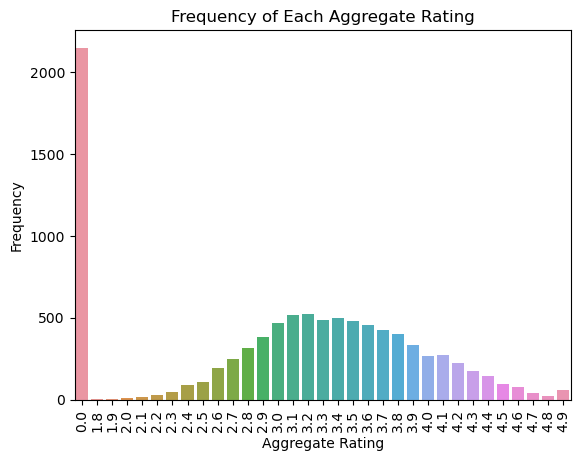

In [4]:
ratings_count = df["Aggregate rating"].value_counts().sort_index()
most_common_ratings = ratings_count.idxmax()
print("most_common_ratings:",most_common_ratings)

sns.barplot(x=ratings_count.index, y=ratings_count.values)
plt.xlabel("Aggregate Rating")
plt.ylabel("Frequency")
plt.xticks(rotation = 90)
plt.title("Frequency of Each Aggregate Rating")
plt.show()


# 

# b - Calculate the average number of votes received by restaurants.


In [5]:
avg_votes = df["Votes"].mean()
print("the avg number of votes by restaurant:",round(avg_votes,2))

the avg number of votes by restaurant: 156.91


# 

# Task 2

# a - Identify the most common combinations of cuisines in the dataset.

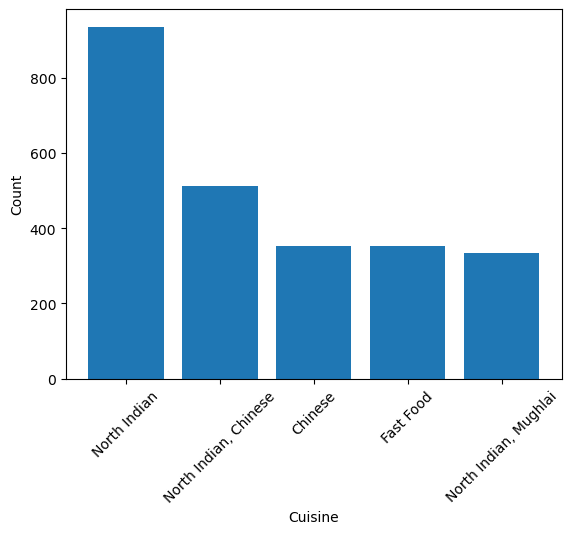

In [6]:
cus = df["Cuisines"].value_counts().head(5)
                                         
                                         
plt.bar(x=cus.index, height=cus.values)
plt.xlabel("Cuisine")
plt.ylabel("Count")
plt.xticks(rotation = 45)
plt.show()

# 

# b -  Determine if certain cuisine combinations tend to have higher ratings.

In [7]:
cus = df.groupby("Cuisines")["Aggregate rating"].mean()
cus.sort_values(ascending= False).head(10)

Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64

# 

# Task - 3 : Geographic Analysis

# a - Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [8]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [9]:
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [10]:
rest_name = df["Restaurant Name"]
latitude = df["Latitude"]
longitude = df["Longitude"]

In [11]:
x = df[["Latitude","Longitude"]]
n_clus = 5

In [12]:
k = KMeans(n_clusters = n_clus,random_state = 42)
df["Cluster"] = k.fit_predict(x)
map_cen = [latitude.mean(),longitude.mean()]
res_map = folium.Map(location = map_cen,zoom_start =12)

In [13]:
cluster_colors = ["red","blue","green","purple","orange"]
for index, row in df.iterrows():
    rest_name = row["Restaurant Name"]
    latitude = row["Latitude"]
    longitude = row["Longitude"]
    cuisines = row["Cuisines"]
    rating = row["Aggregate rating"]
    cluster = row["Cluster"]
    
    popup_text = f"Restaurant: {rest_name}\nCuisines: {cuisines}\nRating: {rating}"
    marker = folium.Marker(location=[latitude, longitude], popup=popup_text)
    marker.add_to(res_map)
    
res_map

# 

# Task 4 -  Restaurant Chains 

# a - Identify if there are any restaurant chains present in the dataset.


In [16]:
res_chains = df.groupby("Restaurant Name").size().reset_index(name= "chain_count")
res_chains = res_chains[res_chains["chain_count"] > 1]
res_chains = res_chains.sort_values(by="chain_count",ascending = False)
res_chains

,Restaurant Name,chain_count
1098,Cafe Coffee Day,83
2098,Domino's Pizza,79
6106,Subway,63
2716,Green Chick Chop,51
4077,McDonald's,48
...,...,...
2770,Gullu's,2
2764,Gulab,2
2746,Grover Sweets,2
2739,Grillz,2


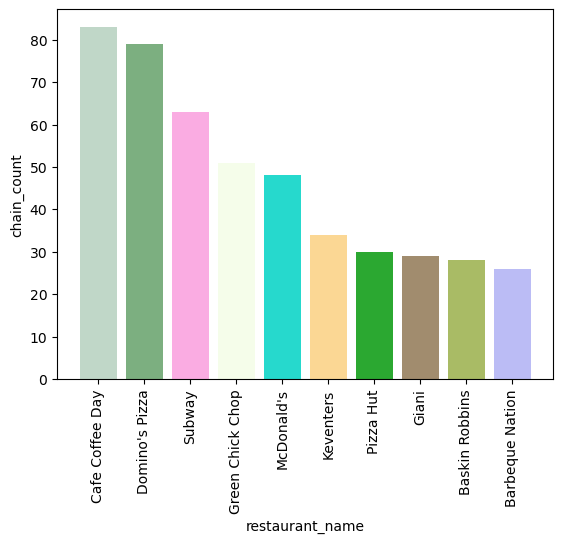

In [17]:
np.random.seed(0)  
random_colors = np.random.rand(len(df), 4) 


plt.bar(res_chains["Restaurant Name"][:10],res_chains["chain_count"][:10],color = random_colors)
plt.xlabel("restaurant_name")
plt.ylabel("chain_count")
plt.xticks(rotation = 90)
plt.show()

# 

In [18]:
res_ratings = df.groupby("Restaurant Name")["Aggregate rating"].mean().reset_index(name = "average_ratings")
res_vote = df.groupby("Restaurant Name")["Votes"].sum().reset_index(name = "total votes")

In [19]:
chain_analaysis = pd.merge(res_ratings,res_vote, on = "Restaurant Name")
chain_analaysis = chain_analaysis.sort_values(by=['average_ratings', 'total votes'], ascending=[False, False])

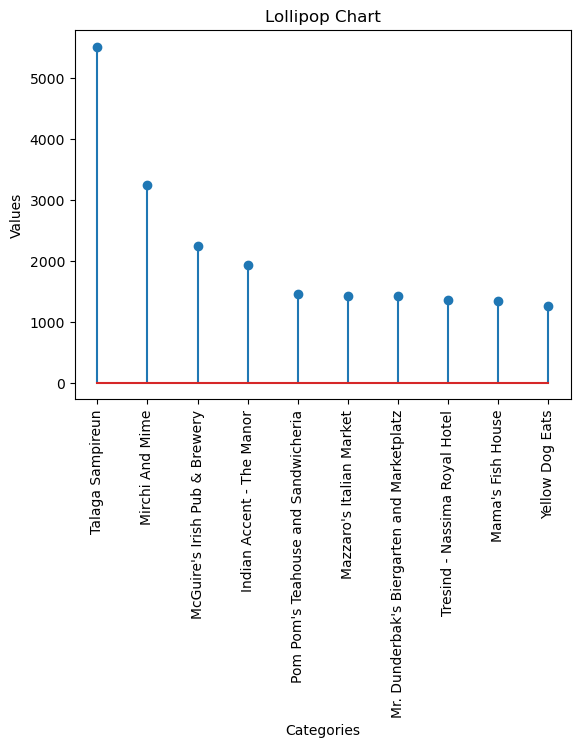

In [20]:
# Lollipop Chart
plt.stem(chain_analaysis["Restaurant Name"][:10], chain_analaysis["total votes"][:10],use_line_collection=True)
plt.xlabel('Categories')
plt.ylabel('Values')
plt.xticks(rotation = 90)
plt.title('Lollipop Chart')
plt.show()
